# Comparison of guitar recording validation set emulations

## Imports

In [1]:
import librosa
import matplotlib.pyplot as plt
import numpy as np
import json
import plotly.graph_objects as go
from scipy.stats import pearsonr
from IPython.display import Audio
from pathlib import Path
from sklearn.metrics.pairwise import cosine_similarity

## Methods

In [2]:
def plot_signal(signal, samplerate):
    fig = plt.figure(figsize=(9, 5))
    plt.plot(np.arange(len(signal))/samplerate, signal)
    plt.grid(alpha=0.4)
    plt.show()
    
def calculate_rms(signal):
    return np.sqrt(np.mean(signal**2))

def normalize_audio_rms(y_fx, y_emu):
    return y_emu*(calculate_rms(y_fx)/calculate_rms(y_emu))

def calculate_mse(a, b):
    return float(np.mean((a-b)**2))

def calculate_corr(a, b):
    corr, _ = pearsonr(a, b)
    return float(corr)

def calculate_mfcc_mse(a, b, samplerate, n_mfccs, hop_length):
    mfcc_a = librosa.feature.mfcc(y=a, sr=samplerate, n_mfcc=n_mfccs, hop_length=hop_length)
    mfcc_b = librosa.feature.mfcc(y=b, sr=samplerate, n_mfcc=n_mfccs, hop_length=hop_length)
    return float(calculate_mse(mfcc_a.reshape(1, -1), mfcc_b.reshape(1, -1)))

def calculate_mfcc_cos_sim(a, b, samplerate, n_mfccs, hop_length):
    mfcc_a = librosa.feature.mfcc(y=a, sr=samplerate, n_mfcc=n_mfccs, hop_length=hop_length)
    mfcc_b = librosa.feature.mfcc(y=b, sr=samplerate, n_mfcc=n_mfccs, hop_length=hop_length)
    return float(cosine_similarity(mfcc_a.reshape(1, -1), mfcc_b.reshape(1, -1))[0][0])

def plot_and_save_metric_scores(
    ir_emu_metric_score = 1,
    ai_emu_metric_score = 0.5,
    fig_name_to_save    = 'pt_2_wav_mse_scores',
    yaxis_title         = 'Mean Squared Error',
    inside_outside_conf = ('inside', 'inside'),
    float_decimals      = 3,
    value_fontsize      = 16
):
    fig = go.Figure()
    fig.add_bar(
        x             = ['IR emulation'],
        y             = [ir_emu_metric_score],
        marker_color  = '#29b6f6',
        text          = [str(round(ir_emu_metric_score, float_decimals))],
        textposition  = inside_outside_conf[0],
        textfont_size = value_fontsize
    )
    fig.add_bar(
        x             = ['AI emulation'],
        y             = [ai_emu_metric_score],
        marker_color  = '#ec407a',
        text          = [str(round(ai_emu_metric_score, float_decimals))],
        textposition  = inside_outside_conf[1],
        textfont_size = value_fontsize
    )
    fig.update_layout(
        width       = 900,
        height      = 500,
        yaxis_title = yaxis_title,
        showlegend  = False
    )
    fig.write_image('../results/{}.pdf'.format(fig_name_to_save))
    fig.show()

## Initial parameters

In [3]:
samplerate          = 44100
n_mfccs             = 30
window_time_sec     = 0.1
hop_length          = int(window_time_sec * samplerate)
validation_set_path = Path('../datasets/guitar_recording/validation/')
fxs_chain_path      = validation_set_path / 'validation_output_44100_16_mono.wav'
ir_emu_path         = validation_set_path / 'ir_emulation_validation_output_44100_16_mono.wav'
ai_emu_path         = validation_set_path / 'ai_emulation_validation_output_44100_16_mono.wav'

## Retrieving validation audio files

### Validation set (ground truth)

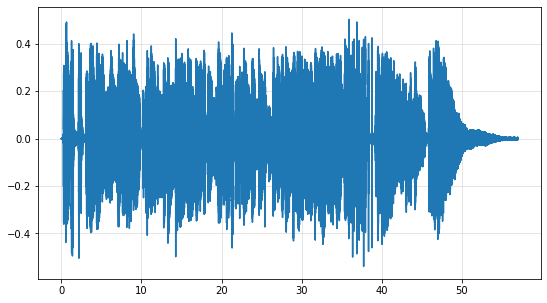

In [4]:
y_fx_chain, _ = librosa.load(path=fxs_chain_path, sr=samplerate)
plot_signal(y_fx_chain, samplerate)
Audio(data=y_fx_chain, rate=samplerate)

### IR emulation

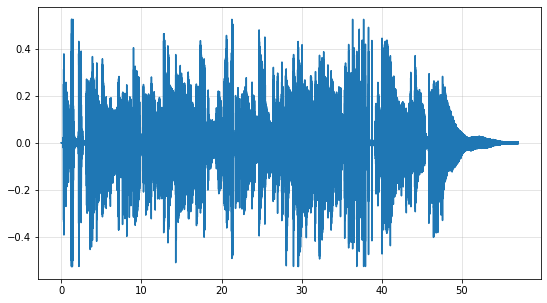

In [5]:
y_ir_emu, _ = librosa.load(path=ir_emu_path, sr=samplerate)
y_ir_emu    = normalize_audio_rms(y_fx_chain, y_ir_emu)
plot_signal(y_ir_emu, samplerate)
Audio(data=y_ir_emu, rate=samplerate)

### AI emulation

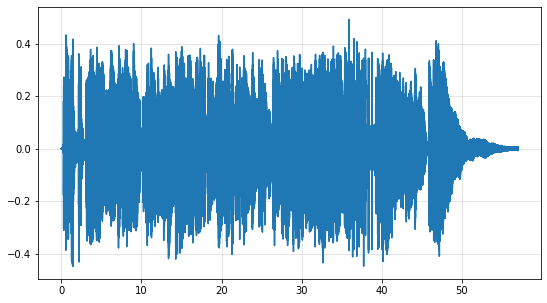

In [6]:
y_ai_emu, _ = librosa.load(path=ai_emu_path, sr=samplerate)
y_ai_emu    = normalize_audio_rms(y_fx_chain, y_ai_emu)
plot_signal(y_ai_emu, samplerate)
Audio(data=y_ai_emu, rate=samplerate)

## Metrics

In [13]:
results = dict(
    mfcc_cos_sim = dict(),
    mfcc_mse     = dict(),
    wav_mse      = dict(),
    wav_corr     = dict()
)

### MFCC Cos Sim

In [16]:
results['mfcc_cos_sim']['ir'] = calculate_mfcc_cos_sim(y_fx_chain, y_ir_emu, samplerate, n_mfccs, hop_length)
results['mfcc_cos_sim']['ai'] = calculate_mfcc_cos_sim(y_fx_chain, y_ai_emu, samplerate, n_mfccs, hop_length)

plot_and_save_metric_scores(
    ir_emu_metric_score = results['mfcc_cos_sim']['ir'],
    ai_emu_metric_score = results['mfcc_cos_sim']['ai'],
    fig_name_to_save    = 'pt_2_mfcc_cos_sim_scores',
    yaxis_title         = 'MFCC Cosine Similarity',
    inside_outside_conf = ('inside', 'inside'),
    float_decimals      = 3
)

### MFCC MSE

In [17]:
results['mfcc_mse']['ir'] = calculate_mfcc_mse(y_fx_chain, y_ir_emu, samplerate, n_mfccs, hop_length)
results['mfcc_mse']['ai'] = calculate_mfcc_mse(y_fx_chain, y_ai_emu, samplerate, n_mfccs, hop_length)

plot_and_save_metric_scores(
    ir_emu_metric_score = results['mfcc_mse']['ir'],
    ai_emu_metric_score = results['mfcc_mse']['ai'],
    fig_name_to_save    = 'pt_2_mfcc_mse_scores',
    yaxis_title         = 'MFCC Mean Squared Error',
    inside_outside_conf = ('inside', 'outside'),
    float_decimals      = 1
)

### WAV MSE

In [18]:
results['wav_mse']['ir'] = calculate_mse(y_fx_chain, y_ir_emu)
results['wav_mse']['ai'] = calculate_mse(y_fx_chain, y_ai_emu)

plot_and_save_metric_scores(
    ir_emu_metric_score = results['wav_mse']['ir'],
    ai_emu_metric_score = results['wav_mse']['ai'],
    fig_name_to_save    = 'pt_2_wav_mse_scores',
    yaxis_title         = 'WAV Mean Squared Error',
    inside_outside_conf = ('inside', 'outside'),
    float_decimals      = 5
)

### WAV Corr

In [19]:
results['wav_corr']['ir'] = calculate_corr(y_fx_chain, y_ir_emu)
results['wav_corr']['ai'] = calculate_corr(y_fx_chain, y_ai_emu)

plot_and_save_metric_scores(
    ir_emu_metric_score = results['wav_corr']['ir'],
    ai_emu_metric_score = results['wav_corr']['ai'],
    fig_name_to_save    = 'pt_2_wav_corr_scores',
    yaxis_title         = 'WAV Spearman Correlation',
    inside_outside_conf = ('outside', 'inside'),
    float_decimals      = 3
)

In [20]:
with open('../results/{}.json'.format('pt_2_bar_plots_values'), mode='w') as f:
    json.dump(results, f, indent=4)

print(json.dumps(results, indent=4))

{
    "mfcc_cos_sim": {
        "ir": 0.959119439125061,
        "ai": 0.9977723360061646
    },
    "mfcc_mse": {
        "ir": 585.8950805664062,
        "ai": 27.711973190307617
    },
    "wav_mse": {
        "ir": 0.004325682297348976,
        "ai": 0.001154951169155538
    },
    "wav_corr": {
        "ir": 0.7590463847257447,
        "ai": 0.9356657148607643
    }
}
